In [1]:
import torch
import os 
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio
import mne

(9, 103320, 256)
target_label: 0


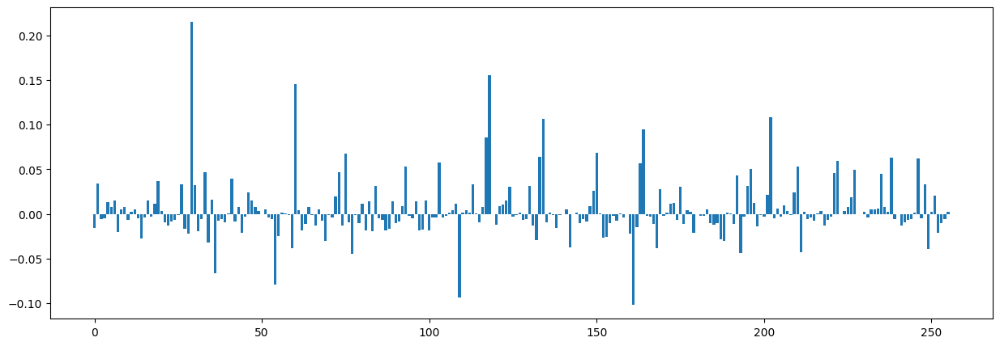

target_label: 1


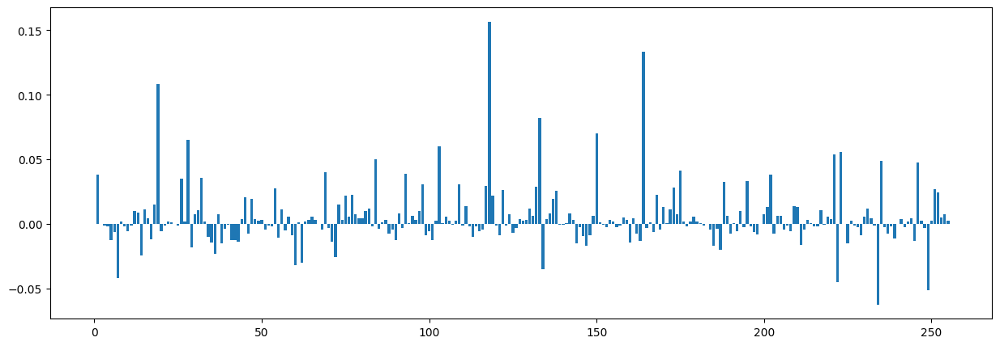

target_label: 2


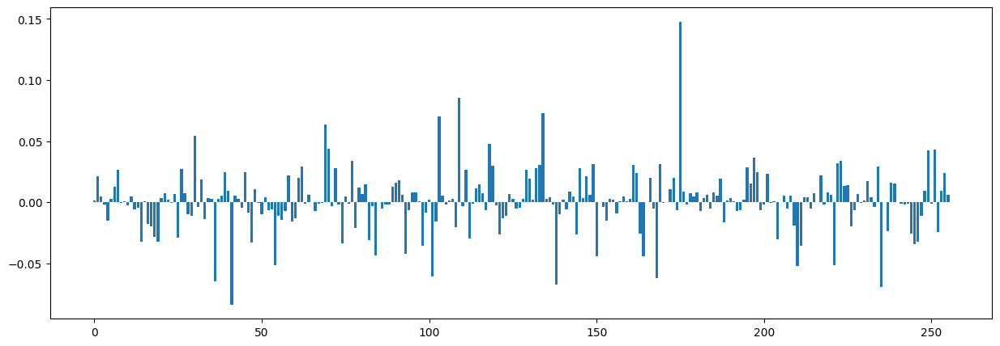

target_label: 3


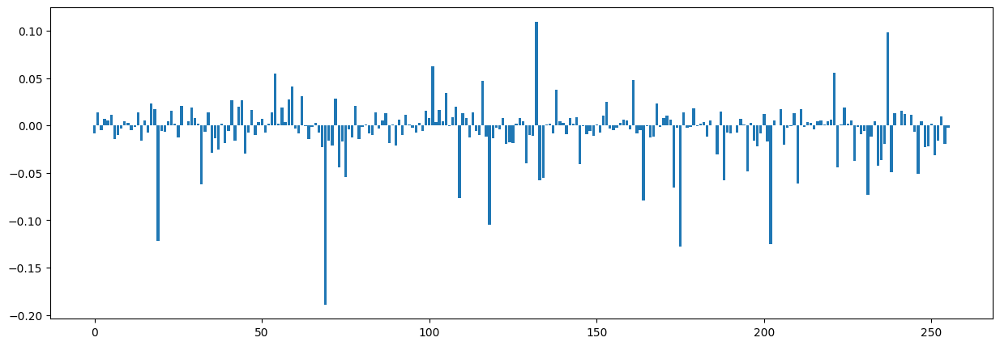

target_label: 4


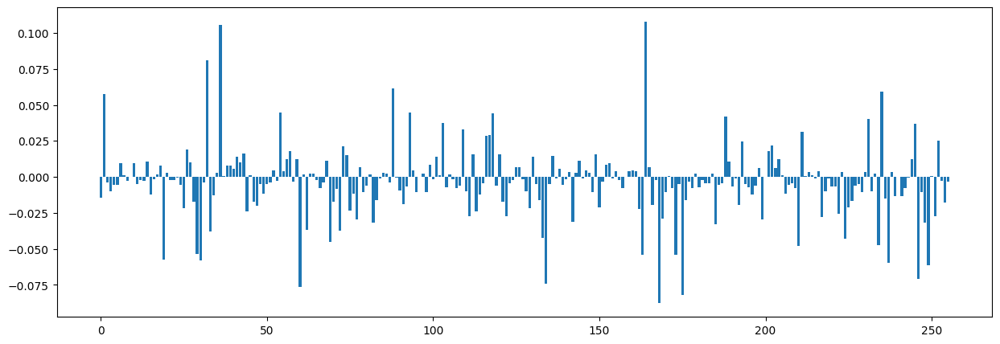

target_label: 5


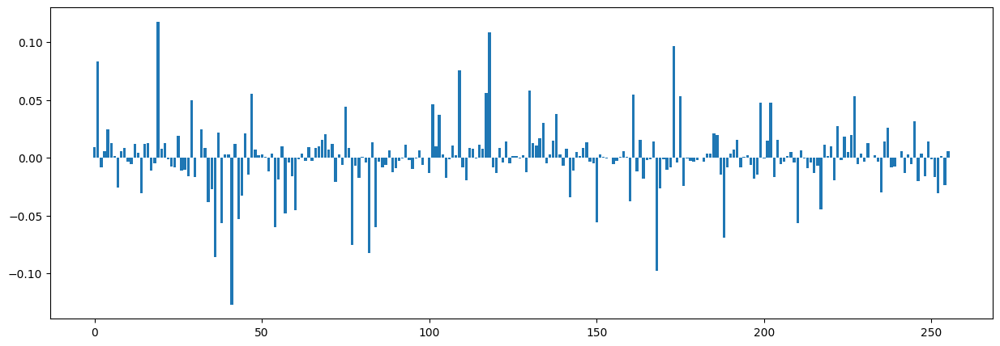

target_label: 6


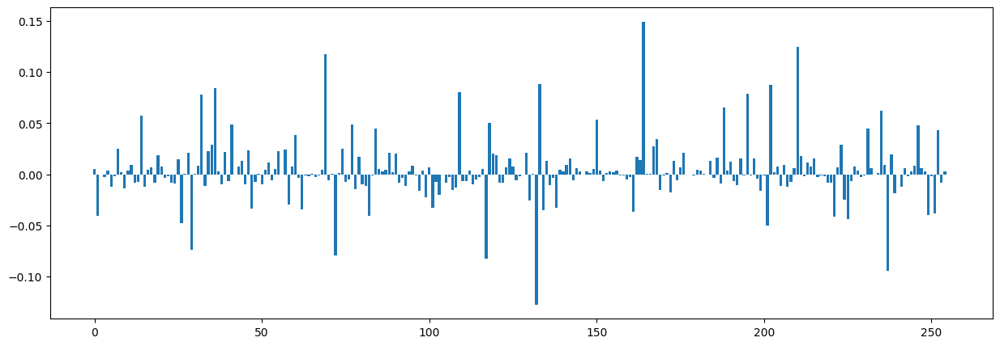

target_label: 7


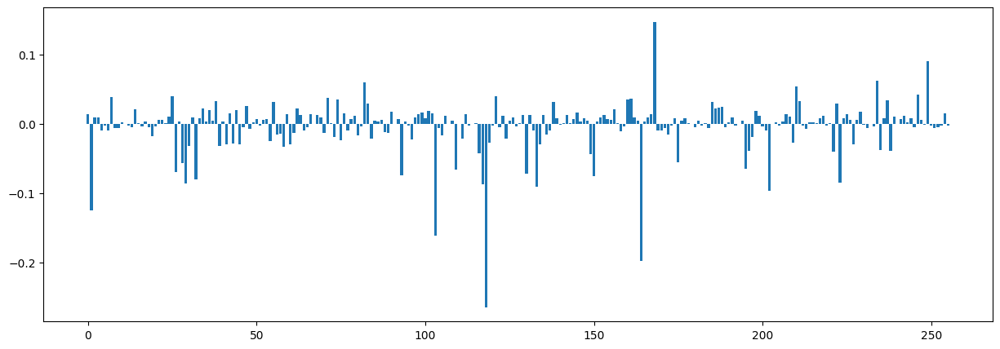

target_label: 8


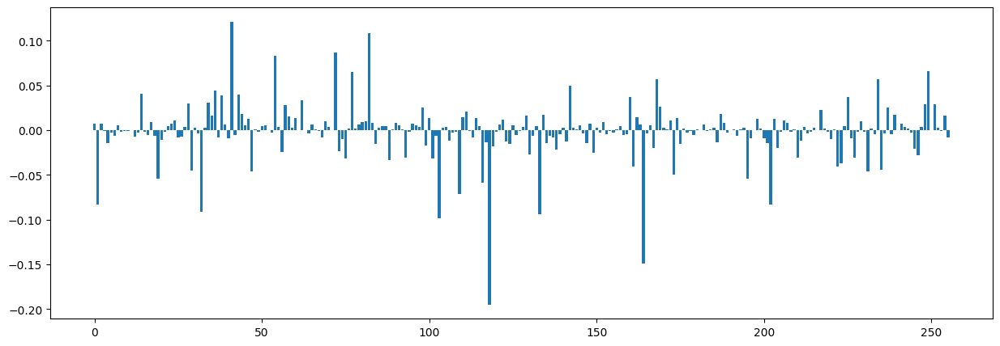

In [2]:
attrs = np.load(r'D:\0_NCCLab\Attention\params\FACED_def_full_29\9_new\importance\attrs_allData_cls_all.npy')
print(attrs.shape)

attrs_mean = np.mean(attrs, axis=1)
for i in range(9):
    print('target_label:', i)
    plt.figure(figsize=(15,5))
    plt.bar(np.arange(256), attrs_mean[i])
    plt.show()

In [3]:
max_dims = np.argmax(np.abs(attrs_mean), axis=1)
foranal = max_dims

In [4]:
param_dir = r'D:\0_NCCLab\Attention\params\FACED_sigmoid_full\r31\ablation_r31_f0_best.ckpt'
state_dict = torch.load(param_dir, map_location='cpu')
print(state_dict['state_dict'].keys())
print(state_dict['state_dict']['model.timeConv.weight'].shape)

C:\Users\Windows\AppData\Local\Temp\ipykernel_32488\3065848445.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(param_dir, map_location='cpu')


odict_keys(['model.timeConv.weight', 'model.timeConv.bias', 'model.msConv1.weight', 'model.msConv1.bias', 'model.msConv2.weight', 'model.msConv2.bias', 'model.msConv3.weight', 'model.msConv3.bias', 'model.msConv4.weight', 'model.msConv4.bias', 'model.att_conv.weight', 'model.att_conv.bias', 'model.att_pointConv.weight', 'model.att_pointConv.bias', 'model.timeConv1.weight', 'model.timeConv1.bias', 'model.timeConv2.weight', 'model.timeConv2.bias'])
torch.Size([16, 1, 1, 30])


In [5]:
timeWeight = torch.squeeze(state_dict['state_dict']['model.timeConv.weight']).cpu().numpy()
print(timeWeight.shape)

n_timeFilters = timeWeight.shape[0]
timeFilterLen = timeWeight.shape[1]
fs = 125
f = fs * np.arange(timeFilterLen) / timeFilterLen

(16, 30)


In [6]:
datadir = 'Z:/qingzhu/AutoICA_Processed_EEG/Faced/Processed_data_filter_epoch_0.50_47_Auto_ICA_def_Threshold/processed_data'
files = os.listdir(datadir)
files = sorted(files)
# print(files)

data_all = np.zeros((123,30,228848))
for i in range(123):
    data_all[i] = sio.loadmat(os.path.join(datadir, files[i]))['data_all_cleaned']
data_all = np.expand_dims(data_all, 1)
print(data_all.shape)

n_samples_one = sio.loadmat(os.path.join(datadir, files[i]))['n_samples_one'][0]
n_samples_cum = np.cumsum(np.concatenate((np.array([0]), np.round(n_samples_one*125)))).astype(int)
print(n_samples_one)
print(n_samples_cum)

(123, 1, 30, 228848)
[ 80.992  62.992  72.992  77.992  68.992  89.992  55.992  59.992 104.992
  44.992  59.992  80.992  34.992  43.992  37.992  42.992  54.992  68.992
  72.992 128.992  76.992  74.992  33.992  36.992  67.     62.992  53.992
  76.992]
[     0  10124  17998  27122  36871  45495  56744  63743  71242  84366
  89990  97489 107613 111987 117486 122235 127609 134483 143107 152231
 168355 177979 187353 191602 196226 204601 212475 219224 228848]


In [7]:
import torch.nn as nn
convLayer = nn.Conv2d(1, n_timeFilters, (1, timeFilterLen), padding=(0, (timeFilterLen-1)//2))
print(convLayer.state_dict().keys())
convLayer.state_dict()['weight'].copy_(state_dict['state_dict']['model.timeConv.weight'])
convLayer.state_dict()['bias'].copy_(state_dict['state_dict']['model.timeConv.bias'])

odict_keys(['weight', 'bias'])


tensor([ 0.6806,  0.5984,  0.6846, -0.7743, -1.4000, -0.5774,  0.4031,  0.5199,
        -0.6107, -0.8100, -0.6411,  0.8495,  0.0186, -0.6195, -1.0100,  0.5867])

In [13]:
data_all = torch.from_numpy(data_all)
data_all = data_all.float()
data_timeConv_all = torch.zeros((123,16,30,0))
for i in range(28):  
    data_timeConv_all = torch.cat((data_timeConv_all, convLayer(data_all[:,:,:,n_samples_cum[i]: n_samples_cum[i+1]])), dim=-1)
print(data_timeConv_all.shape)

RuntimeError: [enforce fail at alloc_cpu.cpp:114] data. DefaultCPUAllocator: not enough memory: you tried to allocate 28863475200 bytes.

In [8]:
data_all = torch.from_numpy(data_all)
data_all = data_all.float()


In [9]:
spatialWeight = np.zeros((0,30,3))
for i in range(4):
    spatialWeight = np.concatenate((spatialWeight, torch.squeeze(state_dict['state_dict']['model.msConv%d.weight' % (i+1)]).cpu().numpy()), 0)
print(spatialWeight.shape)

(256, 30, 3)


In [11]:
data_timeConv_all = data_timeConv_all.detach().numpy()
n_subs = 123
data_cov_all = np.zeros((16, 30, 30))
for i in range(16):
    data_cov = np.zeros((30,30))
    for sub in range(n_subs):
        data_cov = data_cov + np.dot(data_timeConv_all[sub,i,:,:], data_timeConv_all[sub,i,:,:].transpose())
    data_cov = data_cov / n_subs
    
    data_cov_all[i] = data_cov

In [12]:
spatialActivation = np.zeros((256,30,3))
spatial_inds = np.arange(256)
for i in range(len(spatial_inds)):
    timeInd = (i - i // 64 * 64) // 4
    spatialActivation[i] = np.dot(data_cov_all[timeInd,:,:], spatialWeight[i])

In [19]:
chn_names_array = sio.loadmat(r'Z:\qingzhu\AutoICA_Processed_EEG\Faced\Processed_data_filter_epoch_0.50_47_Auto_ICA_def_Threshold\EEG_label.mat')['EEG_label']
chn_names = [chn_names_array[i][0][0] for i in range(len(chn_names_array))]
chn_names[14] = 'T7'
chn_names[15] = 'T8'
chn_names[23] = 'P7'
chn_names[24] = 'P8'
print(chn_names)
Info = mne.create_info(ch_names=chn_names, sfreq=125, ch_types='eeg')
Info.set_montage('biosemi32')

['Fp1', 'Fp2', 'Fz', 'F3', 'F4', 'F7', 'F8', 'FC1', 'FC2', 'FC5', 'FC6', 'Cz', 'C3', 'C4', 'T7', 'T8', 'CP1', 'CP2', 'CP5', 'CP6', 'Pz', 'P3', 'P4', 'P7', 'P8', 'PO3', 'PO4', 'Oz', 'O1', 'O2']


<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, Fz, F3, F4, F7, F8, FC1, FC2, FC5, FC6, Cz, C3, C4, ...
 chs: 30 EEG
 custom_ref_applied: False
 dig: 33 items (3 Cardinal, 30 EEG)
 highpass: 0.0 Hz
 lowpass: 62.5 Hz
 meas_date: unspecified
 nchan: 30
 projs: []
 sfreq: 125.0 Hz
>

In [14]:
print('foranal:', foranal)
print('attributions mean:', attrs_mean[np.arange(9), foranal])
interval = foranal // 64
print('interval: ', interval)
time_inds = (foranal - interval*64) // 4
print('time_inds:', time_inds)
spatial_inds = foranal - interval*64 - time_inds * 4 
print('spatial_inds:', spatial_inds)

foranal: [ 29 118 175  69 164  41 164 118 118]
attributions mean: [ 0.21522373  0.15666737  0.1476877  -0.18903612  0.10792356 -0.12712857
  0.14948425 -0.26514238 -0.19493596]
interval:  [0 1 2 1 2 0 2 1 1]
time_inds: [ 7 13 11  1  9 10  9 13 13]
spatial_inds: [1 2 3 1 0 1 0 2 2]


In [15]:
# delta_t = 1 / 125 * (data_freq1_mean.shape[-1] / len_max)  # 采样间隔
f1 = fs * np.arange(timeFilterLen) / timeFilterLen
# f2 = np.linspace(0.0, 1.0/(2.0*delta_t), magnitude_grandMean.shape[-1]//2)

# f1[0] = f2[64]
# f2 = f2[64:]

In [10]:
import matplotlib
matplotlib.rcParams['font.family'] = 'Arial'

In [11]:
time_inds = np.arange(timeWeight.shape[0])

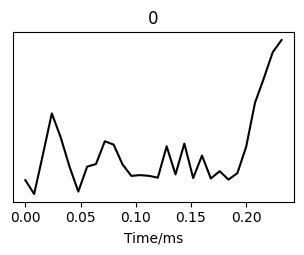

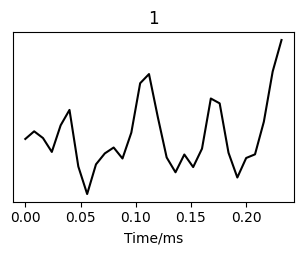

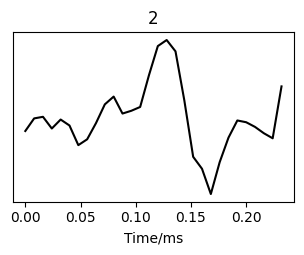

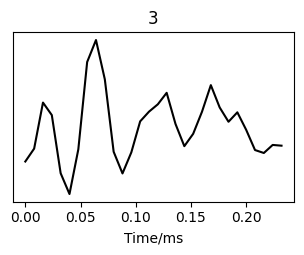

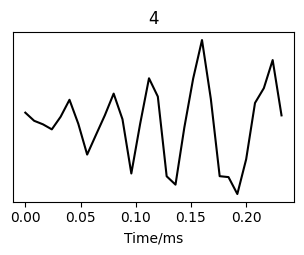

...

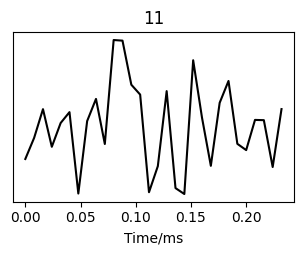

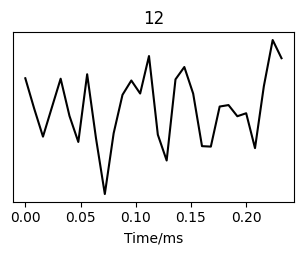

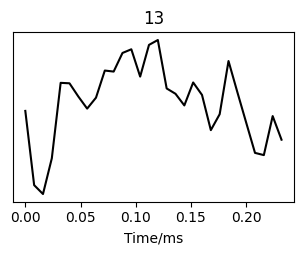

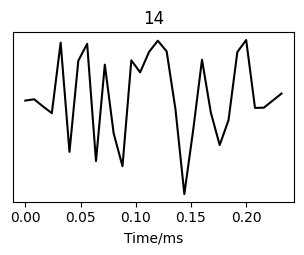

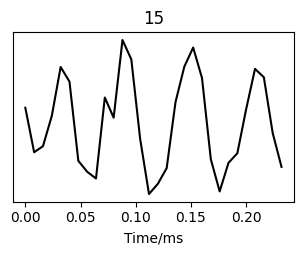

In [13]:
for i in range(16):   
    # print('ind %d, attrs mean: %.3f' % (foranal[i], attrs_mean[i,foranal[i]]))
    # print('time filter %d' % time_inds[i])
    plt.figure(figsize=(8,2.2))
    sp = np.abs(np.fft.fft(timeWeight[time_inds[i], ::-1]))
    plt.subplot(121)
    plt.plot(np.arange(0,1/125*30,1/125), timeWeight[time_inds[i]], 'k')
    plt.yticks([])
    plt.xlabel('Time/ms')
    plt.title(str(i))
    # plt.title('Temporal filter')

In [15]:
spatialWeight.shape

(256, 30, 3)

In [16]:
vlim_max_w = np.max(np.abs(spatialWeight))

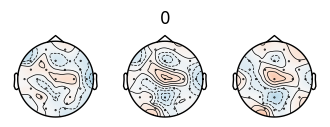

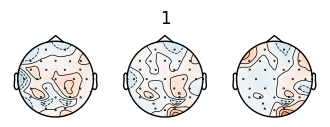

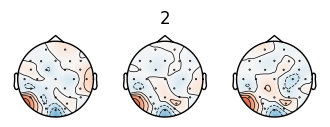

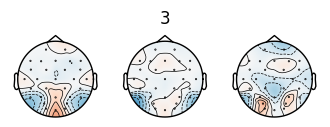

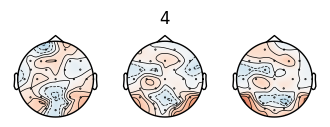

...

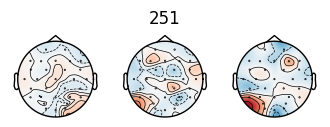

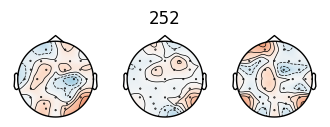

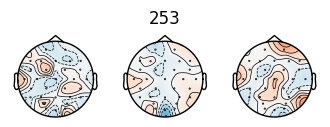

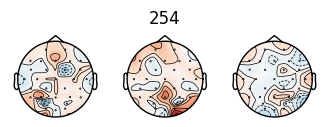

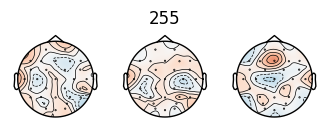

In [22]:
for i in range(256):   
    # fig = plt.figure(figsize=(6,2.5))
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(4, 1.4))
    ax1,ax2,ax3 = axes
    # ax4,ax5,ax6 = axes[1]
    im,cm   = mne.viz.plot_topomap(spatialWeight[i,:,0].squeeze(), Info, axes=ax1,show=False, vlim=[-vlim_max_w,vlim_max_w])   
    im,cm   = mne.viz.plot_topomap(spatialWeight[i,:,1].squeeze(), Info, axes=ax2,show=False, vlim=[-vlim_max_w,vlim_max_w]) 
    ax2.set_title(str(i))  
    im,cm   = mne.viz.plot_topomap(spatialWeight[i,:,2].squeeze(), Info, axes=ax3,show=False, vlim=[-vlim_max_w,vlim_max_w])       
    plt.show()

ind 29, attrs mean: 0.215
time filter 7


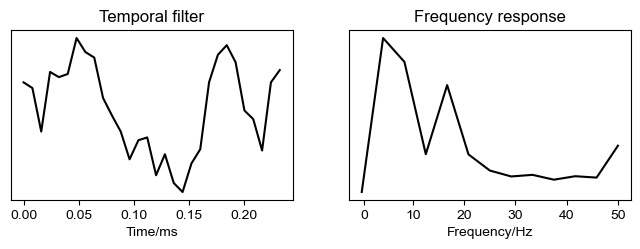

interval 0, spatial filter 29


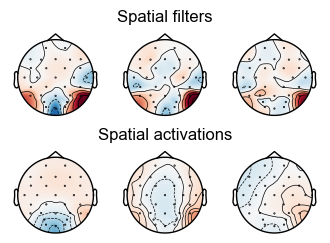

ind 118, attrs mean: 0.157
time filter 13


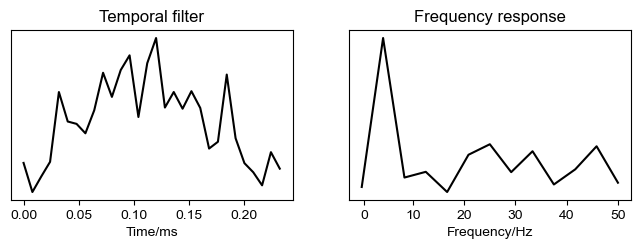

interval 1, spatial filter 118


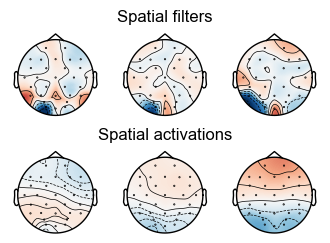

ind 175, attrs mean: 0.148
time filter 11


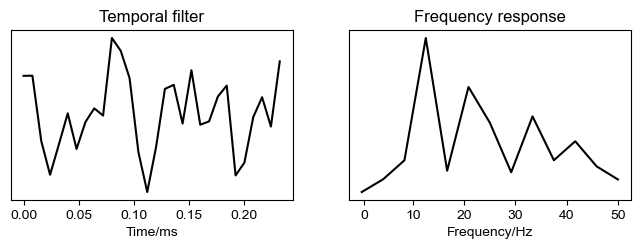

interval 2, spatial filter 175


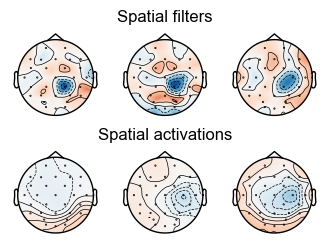

ind 69, attrs mean: -0.189
time filter 1


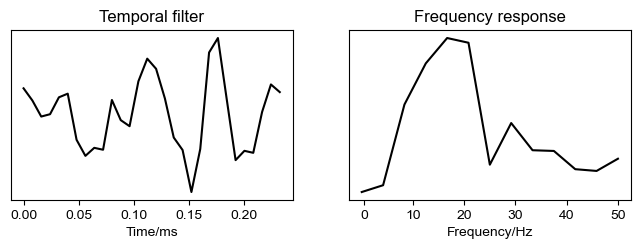

interval 1, spatial filter 69


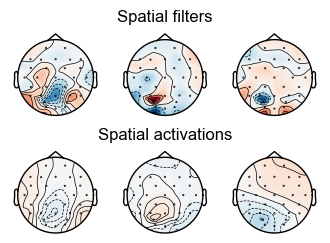

ind 164, attrs mean: 0.108
time filter 9


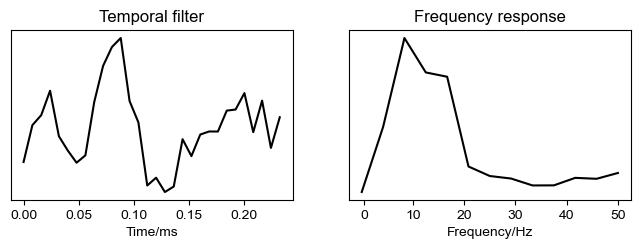

interval 2, spatial filter 164


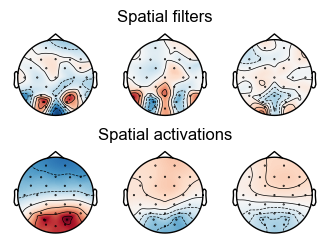

ind 41, attrs mean: -0.127
time filter 10


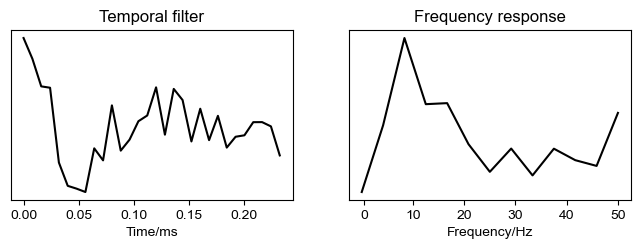

interval 0, spatial filter 41


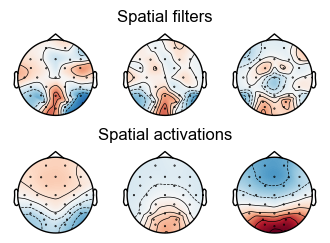

ind 164, attrs mean: 0.149
time filter 9


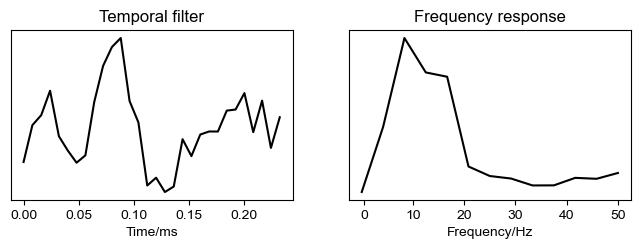

interval 2, spatial filter 164


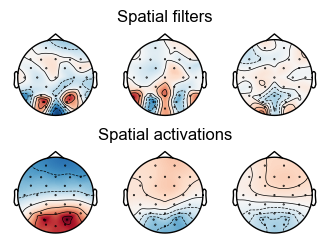

ind 118, attrs mean: -0.265
time filter 13


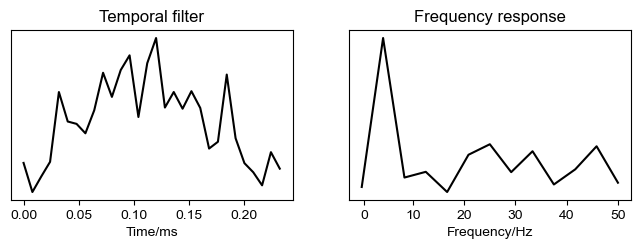

interval 1, spatial filter 118


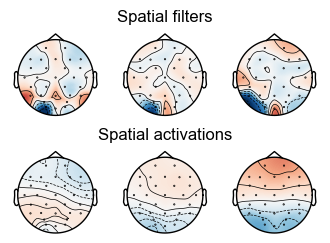

ind 118, attrs mean: -0.195
time filter 13


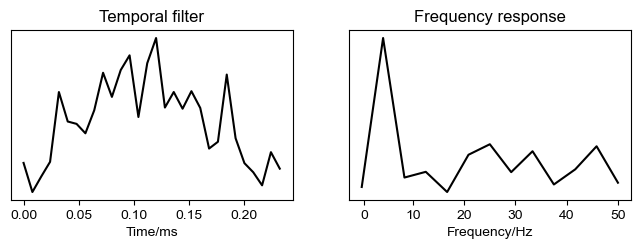

interval 1, spatial filter 118


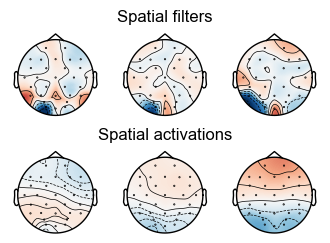

In [36]:
import matplotlib
from matplotlib import font_manager
font_path = '/home/ncclab/.fonts/Arial.ttf'
font_manager.fontManager.addfont(font_path)
matplotlib.rcParams['font.family'] = 'Arial'

vlim_max_w, vlim_max_a = np.max(np.abs(spatialWeight[foranal])), np.max(np.abs(spatialActivation[foranal]))
for i in range(len(foranal)):   
    print('ind %d, attrs mean: %.3f' % (foranal[i], attrs_mean[i,foranal[i]]))
    print('time filter %d' % time_inds[i])
    plt.figure(figsize=(8,2.2))
    sp = np.abs(np.fft.fft(timeWeight[time_inds[i], ::-1]))
    plt.subplot(121)
    plt.plot(np.arange(0,1/125*30,1/125), timeWeight[time_inds[i]], 'k')
    plt.yticks([])
    plt.xlabel('Time/ms')
    plt.title('Temporal filter')
    
    plt.subplot(122)
    plt.plot(f1[f1<=50], sp[f1<=50], 'k')
    plt.yticks([])
    plt.xticks([0.5,10,20,30,40,50], np.array([0.5,10,20,30,40,50]).astype(int))
    plt.xlabel('Frequency/Hz')
    plt.title('Frequency response')
    plt.savefig('/mnt/dataset0/xinke/attention_results/timeFilter%d_emo%d_ind%d.jpg' % (time_inds[i], i, foranal[i]), dpi=300, bbox_inches='tight')
    plt.show()
    
    # plt.subplot(133)
    # plt.plot(np.log(f2[f2<=50]), np.log(magnitude_grandMean[time_inds[i],64:][f2<=50]))
    # plt.xticks([0.5,10,20,30,40,50], np.array([0.5,10,20,30,40,50]).astype(int))
    # plt.title('Frequency domain')
    # plt.xlabel('Log Frequency (Hz)')
    # plt.ylabel('Log Magnitude')
    # plt.show()
    
    print('interval %d, spatial filter %d' % (interval[i], foranal[i]))    
    
    # fig = plt.figure(figsize=(6,2.5))
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(4, 2.8))
    ax1,ax2,ax3 = axes[0]
    ax4,ax5,ax6 = axes[1]
    im,cm   = mne.viz.plot_topomap(spatialWeight[foranal[i],:,0].squeeze(), Info, axes=ax1,show=False, vlim=[-vlim_max_w,vlim_max_w])   
    im,cm   = mne.viz.plot_topomap(spatialWeight[foranal[i],:,1].squeeze(), Info, axes=ax2,show=False, vlim=[-vlim_max_w,vlim_max_w]) 
    ax2.set_title('Spatial filters')  
    im,cm   = mne.viz.plot_topomap(spatialWeight[foranal[i],:,2].squeeze(), Info, axes=ax3,show=False, vlim=[-vlim_max_w,vlim_max_w])       
    
    im,cm   = mne.viz.plot_topomap(spatialActivation[foranal[i],:,0].squeeze(), Info, axes=ax4,show=False, vlim=[-vlim_max_a,vlim_max_a])   
    im,cm   = mne.viz.plot_topomap(spatialActivation[foranal[i],:,1].squeeze(), Info, axes=ax5,show=False, vlim=[-vlim_max_a,vlim_max_a])   
    ax5.set_title('Spatial activations')  
    
    im,cm   = mne.viz.plot_topomap(spatialActivation[foranal[i],:,2].squeeze(), Info, axes=ax6,show=False, vlim=[-vlim_max_a,vlim_max_a]) 
    plt.savefig('/mnt/dataset0/xinke/attention_results/spatialFilter%d_emo%d_interval%d_time%d_spatial%d.jpg' % (foranal[i], i, interval[i], time_inds[i], spatial_inds[i]), 
                dpi=300, bbox_inches='tight')
    plt.show()

/tmp/ipykernel_1752318/3035506753.py:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # 调整图形布局以适应colorbars


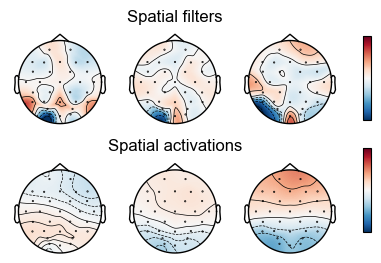

In [34]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(4, 2.8))
ax1,ax2,ax3 = axes[0]
ax4,ax5,ax6 = axes[1]
im,cm   = mne.viz.plot_topomap(spatialWeight[foranal[i],:,0].squeeze(), Info, axes=ax1,show=False, vlim=[-vlim_max_w,vlim_max_w])   
im,cm   = mne.viz.plot_topomap(spatialWeight[foranal[i],:,1].squeeze(), Info, axes=ax2,show=False, vlim=[-vlim_max_w,vlim_max_w]) 
ax2.set_title('Spatial filters')  
im,cm   = mne.viz.plot_topomap(spatialWeight[foranal[i],:,2].squeeze(), Info, axes=ax3,show=False, vlim=[-vlim_max_w,vlim_max_w])

cbar_ax1 = fig.add_axes([0.92, 0.55, 0.02, 0.3])  # 调整位置和大小
cbar1 = fig.colorbar(im, cax=cbar_ax1) 
cbar1.set_ticks([]) 

im,cm   = mne.viz.plot_topomap(spatialActivation[foranal[i],:,0].squeeze(), Info, axes=ax4,show=False, vlim=[-vlim_max_a,vlim_max_a])   
im,cm   = mne.viz.plot_topomap(spatialActivation[foranal[i],:,1].squeeze(), Info, axes=ax5,show=False, vlim=[-vlim_max_a,vlim_max_a])   
ax5.set_title('Spatial activations')  
im,cm   = mne.viz.plot_topomap(spatialActivation[foranal[i],:,2].squeeze(), Info, axes=ax6,show=False, vlim=[-vlim_max_a,vlim_max_a]) 

cbar_ax2 = fig.add_axes([0.92, 0.15, 0.02, 0.3])  # 调整位置和大小
cbar2 = fig.colorbar(im, cax=cbar_ax2)
cbar2.set_ticks([]) 

plt.tight_layout(rect=[0, 0, 0.9, 1])  # 调整图形布局以适应colorbars
plt.savefig('/mnt/dataset0/xinke/attention_results/spatialFilter_withColorbar.jpg', 
            dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
import matplotlib
from matplotlib import font_manager
font_path = '/home/ncclab/.fonts/Arial.ttf'
font_manager.fontManager.addfont(font_path)
matplotlib.rcParams['font.family'] = 'Arial'

for i in range(len(foranal)):   
    print('ind %d, attrs mean: %.3f' % (foranal[i], attrs_mean[i,foranal[i]]))
    print('time filter %d' % time_inds[i])
    plt.figure(figsize=(8,1.4))
    sp = np.abs(np.fft.fft(timeWeight[time_inds[i], ::-1]))
    plt.subplot(121)
    plt.plot(np.arange(0,1/125*30,1/125), timeWeight[time_inds[i]], 'k')
    plt.yticks([])
    plt.xlabel('Time/ms')
    plt.title('Temporal filter')
    
    plt.subplot(122)
    plt.plot(f1[f1<=50], sp[f1<=50], 'k')
    plt.yticks([])
    plt.xticks([0.5,10,20,30,40,50], np.array([0.5,10,20,30,40,50]).astype(int))
    plt.xlabel('Frequency/Hz')
    plt.title('Frequency response')
    plt.savefig('attention_results/timeFilter%d_emo%d_ind%d_short.jpg' % (time_inds[i], i, foranal[i]), dpi=300, bbox_inches='tight')
    plt.show()

In [12]:
# Attention patterns
from model.models import Conv_att_simple_new_returnAtt
model = Conv_att_simple_new_returnAtt(n_timeFilters=16, timeFilterLen=30, n_msFilters=4, msFilter_timeLen=3, n_channs=30, dilation_array=np.array([1,3,6,12]), seg_att=15, avgPoolLen = 15,
                  timeSmootherLen=3, multiFact=2, stratified=[], activ='sigmoid', temp=1.0, saveFea=True, has_att=True, extract_mode='me', global_att=False, return_att=True)

In [13]:
def rename_keys_in_state_dict(state_dict, old_prefix, new_prefix=''):
    ''' 将state_dict中的键从old_prefix重命名为new_prefix '''
    new_state_dict = {}
    for key in state_dict:
        # 移除前缀并添加新前缀
        new_key = key.replace(old_prefix, new_prefix)
        new_state_dict[new_key] = state_dict[key]
    return new_state_dict

# 使用函数重命名键
state_dict_new = rename_keys_in_state_dict(state_dict['state_dict'], 'model.')
model.load_state_dict(state_dict=state_dict_new)

<All keys matched successfully>

In [ ]:
out_all = np.zeros((data_all.shape[0], 256, data_all.shape[3]-28))
att_all = np.zeros((data_all.shape[0], 256, data_all.shape[3]-28))
for i in range(28):
    out, att = model(data_all[:,:,:,n_samples_cum[i]: n_samples_cum[i+1]])
    print(out.shape, att.shape)
    out_all[:,:,n_samples_cum[i]-i: n_samples_cum[i+1]-i-1] = out.detach().squeeze().numpy()
    att_all[:,:,n_samples_cum[i]-i: n_samples_cum[i+1]-i-1] = att.detach().squeeze().numpy()

MemoryError: Unable to allocate 53.7 GiB for an array with shape (123, 256, 228820) and data type float64

In [14]:
# 初始化统计量累加器
sum_att = np.zeros(256)          # 各通道特征值累加和
sum_sq_att = np.zeros(256)       # 各通道特征值平方累加和
count = 0                        # 总样本点数

for i in range(28):
    # 获取当前数据块的注意力图
    _, att = model(data_all[:,:,:,n_samples_cum[i]:n_samples_cum[i+1]])
    current_att = att.detach().squeeze().numpy()  # 形状: (batch_size, 256, time_steps)
    
    # 计算当前块的统计量
    batch_size = current_att.shape[0]
    time_steps = current_att.shape[2]
    flattened_size = batch_size * time_steps  # 当前块总数据点数
    
    # 沿批次和时间维度求和 (axis=(0,2))
    sum_att += current_att.sum(axis=(0, 2))           # 按通道累加特征值
    sum_sq_att += (current_att ** 2).sum(axis=(0, 2))  # 按通道累加特征平方
    count += flattened_size  # 累计总数据点数

# 最终计算全局统计量
att_mean = sum_att / count
att_std = np.sqrt(sum_sq_att/count - att_mean**2)  # 方差 = E(x²) - [E(x)]²

In [15]:
np.save(r'D:\0_NCCLab\Attention\CLISA_Hydra_interp\att_mean.npy', att_mean)
np.save(r'D:\0_NCCLab\Attention\CLISA_Hydra_interp\att_std.npy', att_std)

In [19]:
att_mean = np.mean(np.mean(att_all, axis=-1), axis=0)
out_mean = np.mean(np.mean(out_all, axis=-1), axis=0)
out_max = np.max(np.max(out_all, axis=-1), axis=0)
print(out_max[foranal])

NameError: name 'att_all' is not defined

In [20]:
att_mean_reorder = np.sort(att_mean)[::-1]
att_order = np.argsort(att_mean)[::-1]
out_mean_reorder = np.sort(out_mean)[::-1]
out_order = np.argsort(out_mean)[::-1]
plt.figure(figsize=(15,4))
plt.bar(np.arange(256), att_mean_reorder)
plt.show()
plt.figure(figsize=(15,4))
plt.bar(np.arange(256), out_mean_reorder)
plt.show()
print(att_order)
print(out_order)

NameError: name 'out_mean' is not defined

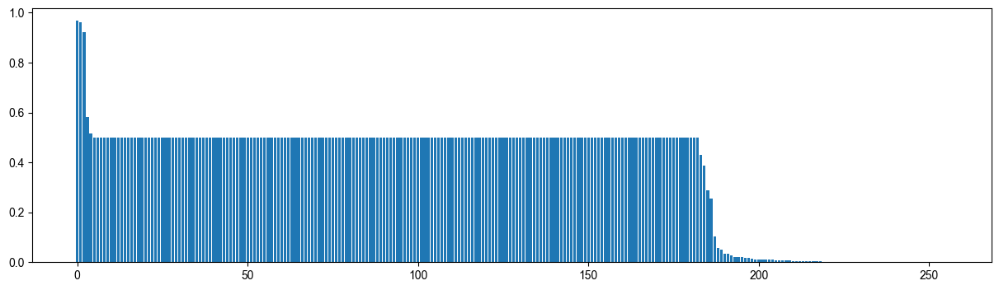

[ 83 145 210 209 237  93 105 104 101 100  99  98  97  96  95  91  92 108
  90  89  87  86  85  82  79  78  76 107 109  71 110 144 143 141 139 138
 137 136 135 134 133 132 131 130 128 254 126 125 124 116 114 113 112 111
  74 127  70  14  26  25  24  23  22  21  20  18  17  15  13  28  11   9
   8   7   6   5   4   3   2   1  27  33 146  50  66  65  63  61  59  56
  55  53  52  51  49  34  48  47  46  45  42  40  38  37  36  35  67   0
 177 184 190 217 188 187 186 218 185 219 191 220 180 179 223 224 225 205
 216 192 176 148 204 203 202 207 201 200 208 199 215 198 197 196 212 213
 214 194 226 206 175 164 174 244 161 246 159 158 157 156 155 248 153 249
 152 251 253 150 149 163 242 241 229 173 167 240 227 239 171 236 228 234
 166 232 168 211 122 231  57  54  41  84  19 255 147 195 221 189 245  94
  16 165 119  12 115  39  10  68 121  30 103 222 117 154 102  44 243  32
 230  75 160 142  43 118 178  80 238 183  73 120  60 123 193 169  29  88
  31 252 182 235 170  62 140 247  58 181 172 151 10

In [16]:
att_mean_reorder = np.sort(att_mean)[::-1]
att_order = np.argsort(att_mean)[::-1]

plt.figure(figsize=(15,4))
plt.bar(np.arange(256), att_mean_reorder)
plt.show()

print(att_order)

In [17]:
att_order = att_order[att_mean_reorder!=0.5]
att_mean_reorder = att_mean_reorder[att_mean_reorder!=0.5]


[31, 47, 11, 9, 42, 5, 1]


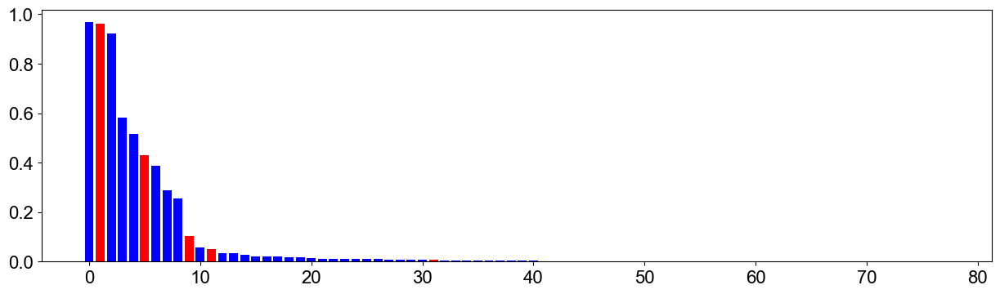

In [19]:
use_inds = [222,183,84,54,43,211,145]
sort_inds = []
for i in range(7):
    sort_inds.append(np.where(att_order==use_inds[i])[0][0])
print(sort_inds)

colors = ['red' if i in sort_inds else 'blue' for i in range(len(att_mean_reorder))]
plt.figure(figsize=(15,4))
plt.bar(np.arange(len(att_mean_reorder)), att_mean_reorder, color=colors)
plt.show()

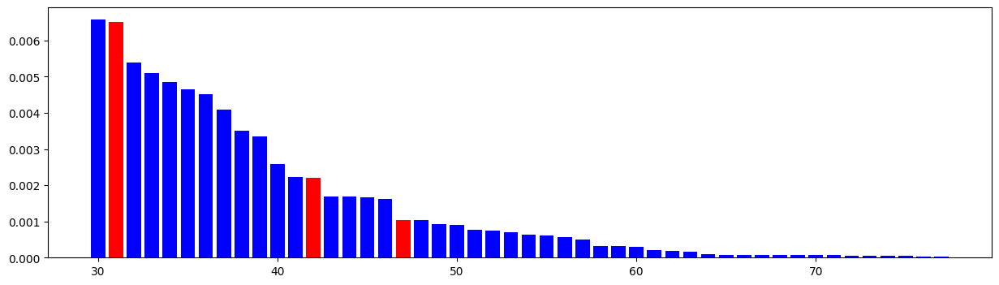

In [41]:
plt.figure(figsize=(15,4))
plt.bar(np.arange(30,len(att_mean_reorder)), att_mean_reorder[30:], color=colors[30:])
plt.show()

In [29]:
print([att_mean_reorder[i] if i in sort_inds else '' for i in range(len(att_mean_reorder))])

['', 0.960521803537129, '', '', '', 0.4313998697275453, '', '', '', 0.10346571385503428, '', 0.04922700014651876, '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', 0.006514336589650606, '', '', '', '', '', '', '', '', '', '', 0.0021948880027030803, '', '', '', '', 0.0010477218418604843, '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']


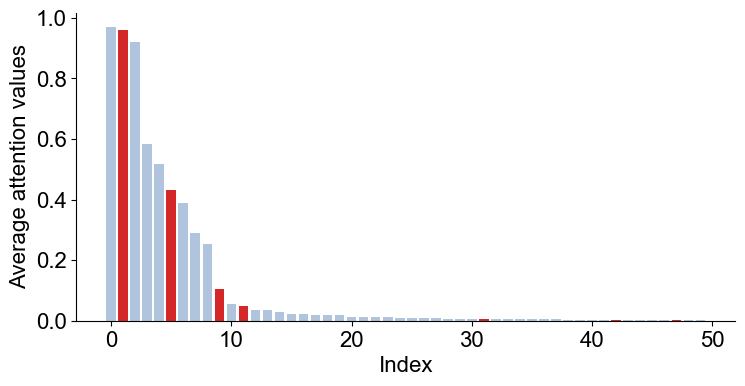

In [21]:
# 创建一个单色调的渐变色（比如 'Blues'）
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 16
cmap = plt.get_cmap("Blues")
colors = cmap(np.linspace(0.3, 1, len(att_mean_reorder)))  # 使用Blues的渐变色，从浅蓝到深蓝

# 突出显示的柱子颜色设置为深红色，其他保持渐变色
base_color = 'lightsteelblue'
highlight_color = 'tab:red'  # 突出显示为红色
colors = [highlight_color if i in sort_inds else base_color for i in range(len(att_mean_reorder))]

# 绘制柱状图
plt.figure(figsize=(8.5, 4))
ax = plt.gca()
plt.bar(np.arange(50), att_mean_reorder[:50], color=colors[:50])

# 显示图形
plt.xlabel("Index")
plt.ylabel("Average attention values")
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.show()

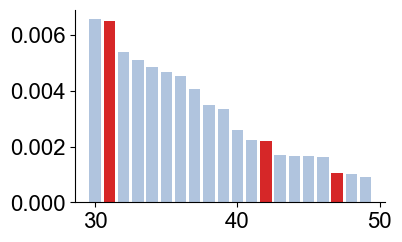

In [28]:
plt.figure(figsize=(4,2.5))
ax = plt.gca()
plt.bar(np.arange(30,50), att_mean_reorder[30:50], color=colors[30:50])
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.show()

att_w


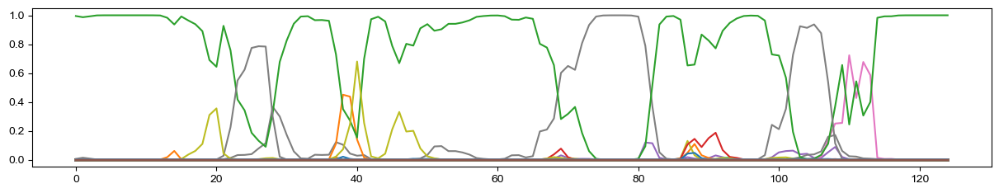

att_w


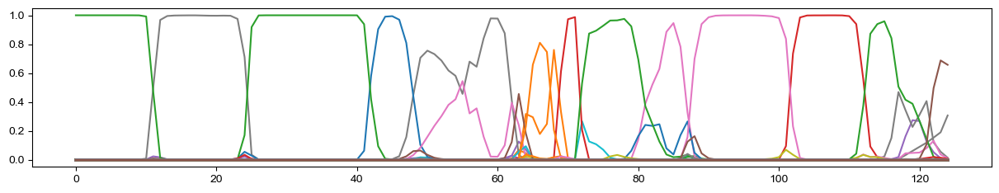

att_w


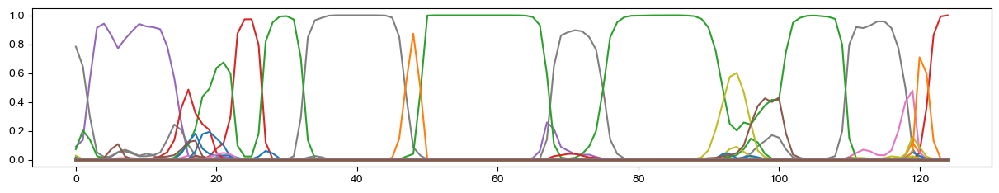

att_w


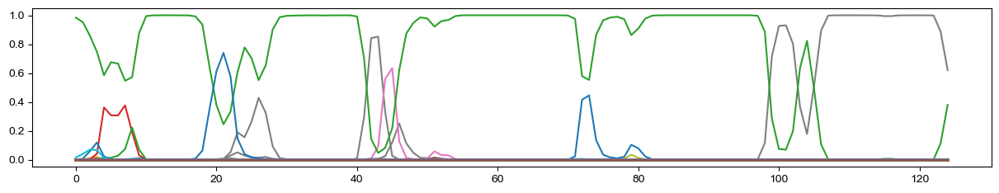

att_w


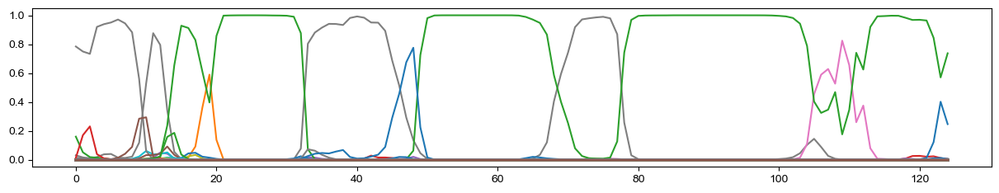

att_w


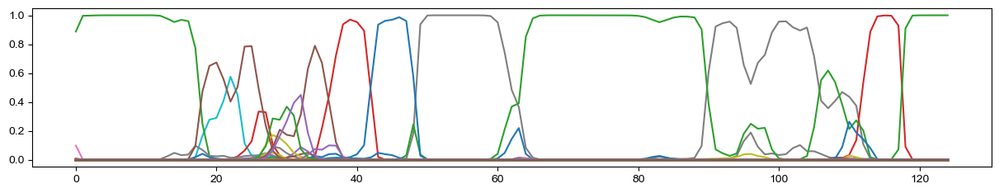

att_w


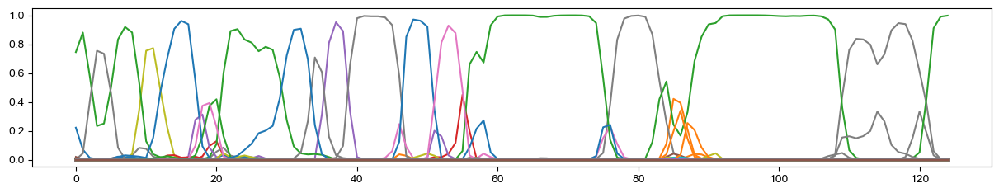

att_w


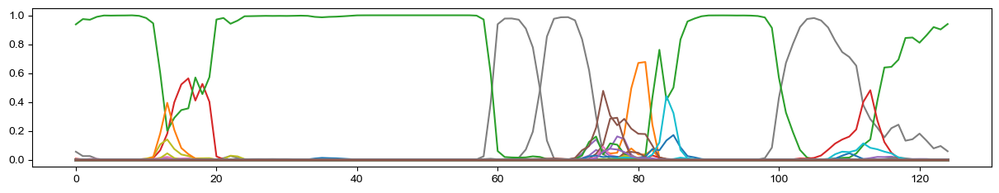

att_w


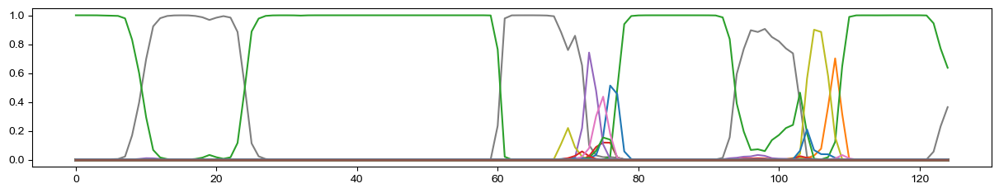

att_w


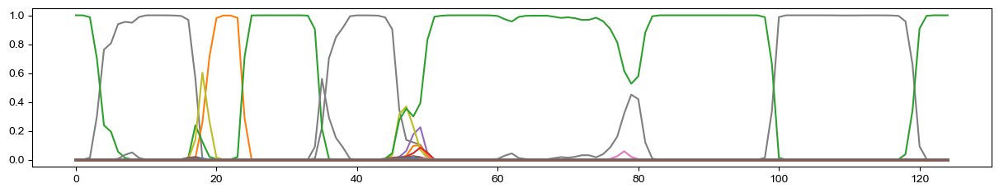

In [45]:
for j in range(10):
    print('att_w')
    plt.figure(figsize=(15,2.5))
    plt.plot(att_all[j,:,250:375].transpose())
    plt.show()
    
    # print('out')
    # plt.figure(figsize=(15,2.5))
    # plt.plot(out_all[j,:,250:375].transpose())
    # plt.show()